# Data visualization

In [52]:
import pandas as pd
from ydata_profiling import ProfileReport
import plotly.express as px
from matplotlib import pyplot as plt

/Users/biancaguedert/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


#### Profile Report

In [54]:
dataSet = pd.read_csv('desafio_manutencao_preditiva_treino.csv')

In [55]:
dataSet

,udi,product_id,type,air_temperature_k,process_temperature_k,rotational_speed_rpm,torque_nm,tool_wear_min,failure_type
0,1,M14860,M,298.1,308.6,1551,42.8,0,No Failure
1,2,L47181,L,298.2,308.7,1408,46.3,3,No Failure
2,5,L47184,L,298.2,308.7,1408,40.0,9,No Failure
3,6,M14865,M,298.1,308.6,1425,41.9,11,No Failure
4,7,L47186,L,298.1,308.6,1558,42.4,14,No Failure
...,...,...,...,...,...,...,...,...,...
6662,9995,L57174,L,298.8,308.3,1634,27.9,12,No Failure
6663,9996,M24855,M,298.8,308.4,1604,29.5,14,No Failure
6664,9997,H39410,H,298.9,308.4,1632,31.8,17,No Failure
6665,9999,H39412,H,299.0,308.7,1408,48.5,25,No Failure


In [56]:
dataSet.dtypes

udi                        int64
product_id                object
type                      object
air_temperature_k        float64
process_temperature_k    float64
rotational_speed_rpm       int64
torque_nm                float64
tool_wear_min              int64
failure_type              object
dtype: object

In [57]:
profileReportDataSet = ProfileReport(dataSet, explorative=True)

In [58]:
profileReportDataSet

Render HTML: 100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


O Profile Report usado na EDA foi salvo como report_baseTreino em html, podendo ser salvo a partir do git e aberto em um browser.  

In [59]:
profileReportDataSet.to_file("report_baseTreino.html")

Export report to file: 100%|██████████| 1/1 [00:00<00:00, 48.83it/s]


Considerations:

* The columns 'id' and 'udi' have unique values for each record, so they will not be used in training.

* The 'type' column has three types of categorical records that need to be handled for model execution.

* RPM and torque have a negative correlation, so it might be useful to use only one of them.

* Tair and T process have a positive correlation, so it might be useful to use only one of them.

* Normalize because we have values with very different magnitudes.

* The variable to be predicted (Failure type) is a categorical variable.

* 96.5% of the records show "No failure" in the 'failure_type' column, and this imbalance in records could be an issue in training. To address this problem, I will run tests with Oversampling, Undersampling, and by adjusting the `class_weight` parameter in the models.

             
             

### Scatter Graphs

In [3]:
basescatter = dataSet.drop(dataSet[dataSet['failure_type'] == 'No Failure'].index)

#### Temperature

* It is possible to observe that the failure type 'Heat Dissipation Failure' presents a very narrow range of values for both 'process_temperature_k' and 'air_temperature_k'.

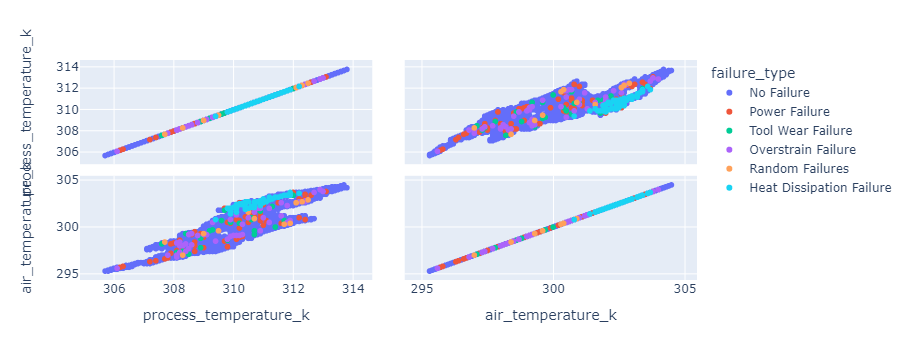

In [4]:
graph = px.scatter_matrix(dataSet, dimensions=['process_temperature_k','air_temperature_k'], color = 'failure_type')
graph

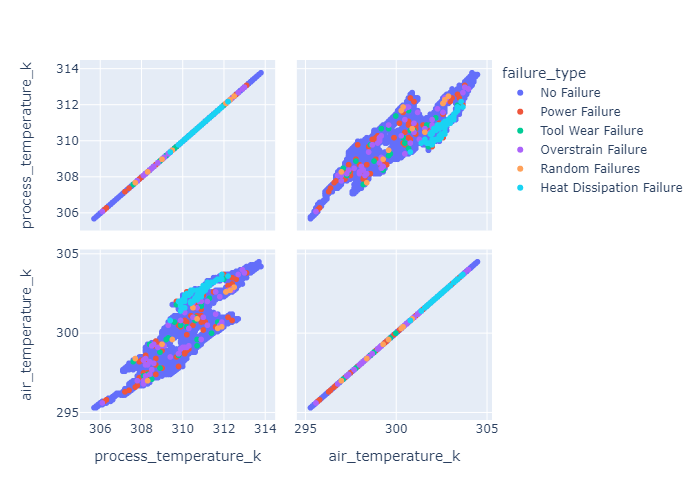

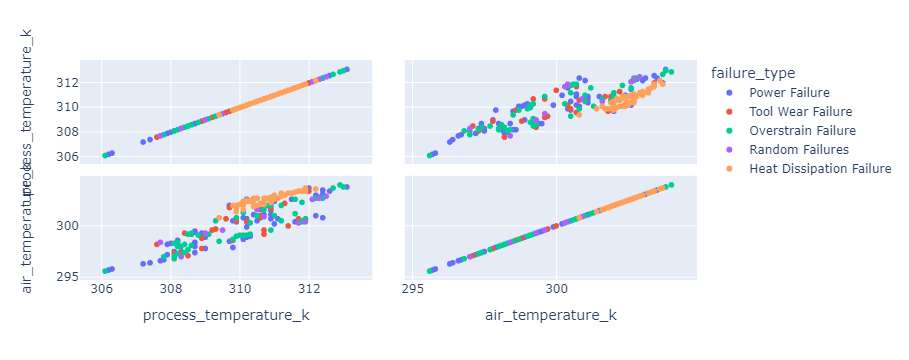

In [9]:
graph = px.scatter_matrix(basescatter, dimensions=['process_temperature_k','air_temperature_k'], color = 'failure_type')
graph

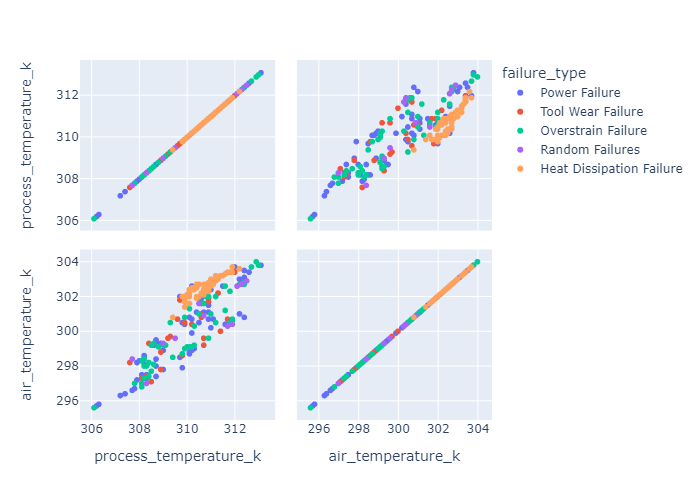

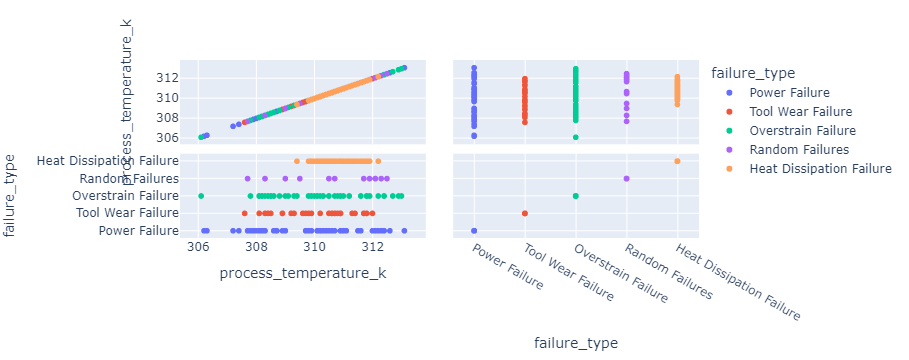

In [11]:
graph = px.scatter_matrix(basescatter, dimensions=['process_temperature_k', 'failure_type'], color = 'failure_type')
graph

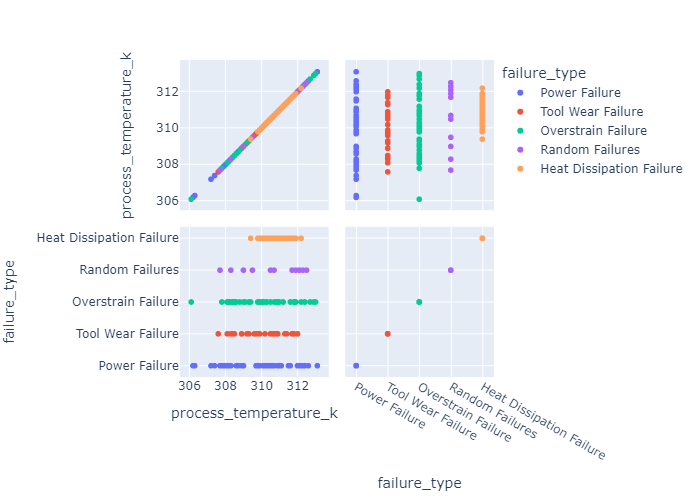

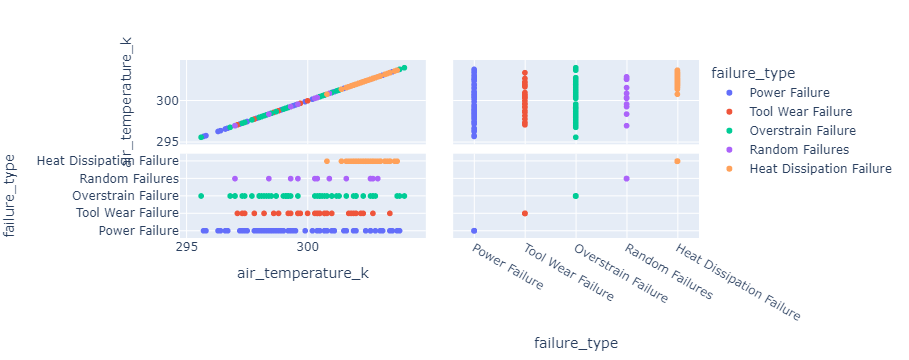

In [13]:
graph = px.scatter_matrix(basescatter, dimensions=['air_temperature_k', 'failure_type'], color = 'failure_type')
graph

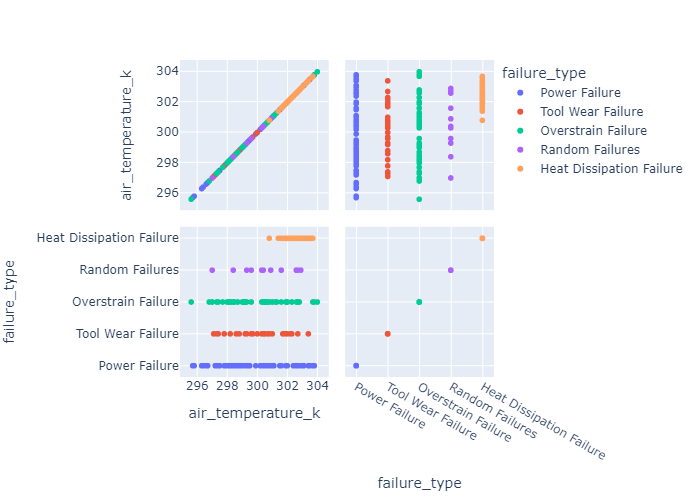

#### Torque and rotational speed

* The failures of type 'Overstrain Failure', 'Heat Dissipation Failure', and 'Random Failure' occur within narrow ranges of torque values.

* The 'Power Failure' type is concentrated in the lowest and highest ranges of torque.

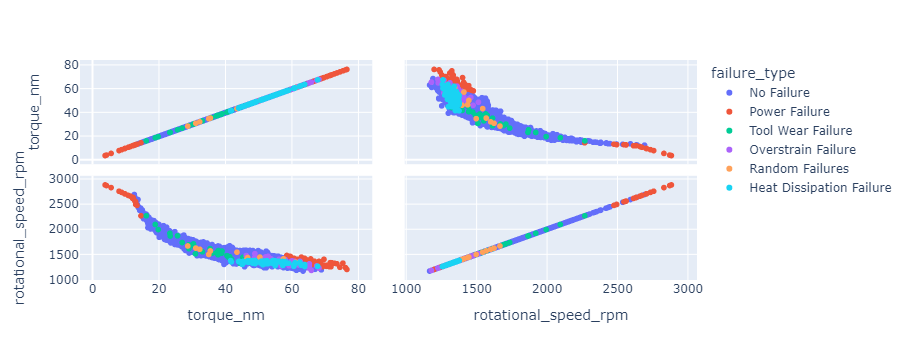

In [15]:
graph = px.scatter_matrix(dataSet, dimensions=['torque_nm','rotational_speed_rpm'], color = 'failure_type')
graph

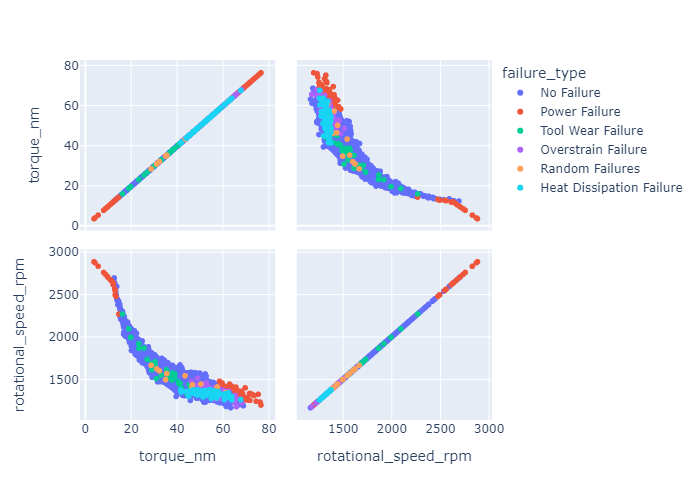

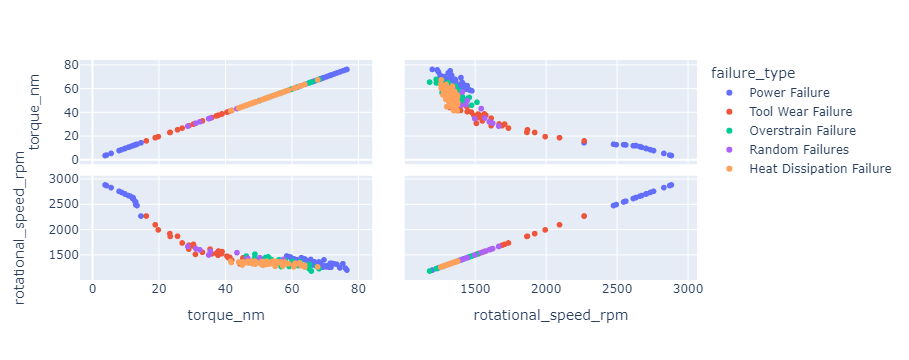

In [17]:
graph = px.scatter_matrix(basescatter, dimensions=['torque_nm','rotational_speed_rpm'], color = 'failure_type')
graph

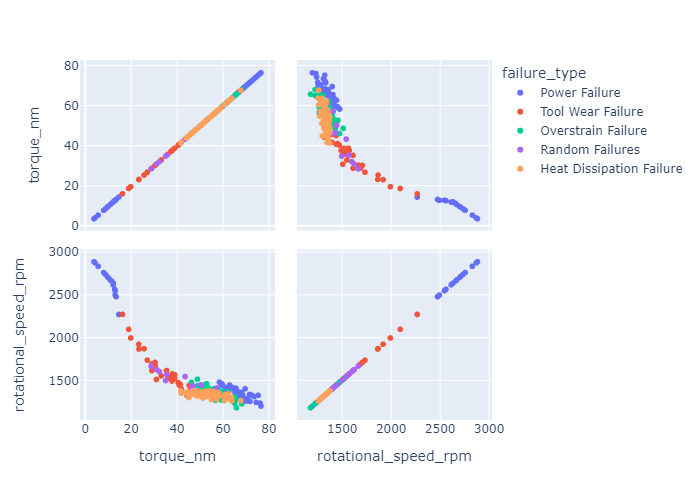

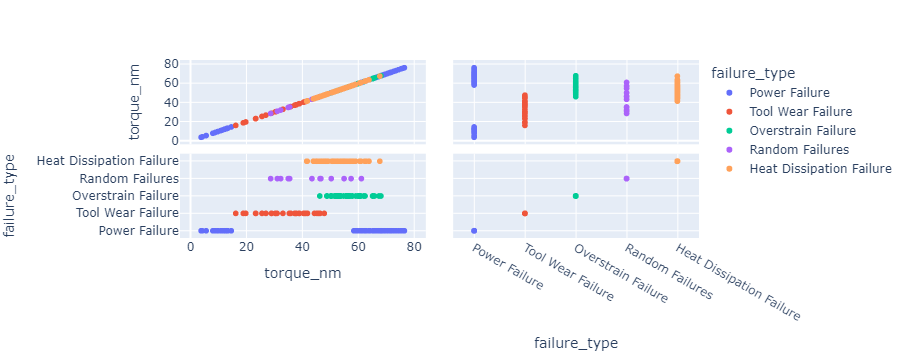

In [19]:
graph = px.scatter_matrix(basescatter, dimensions=['torque_nm', 'failure_type'], color = 'failure_type')
graph

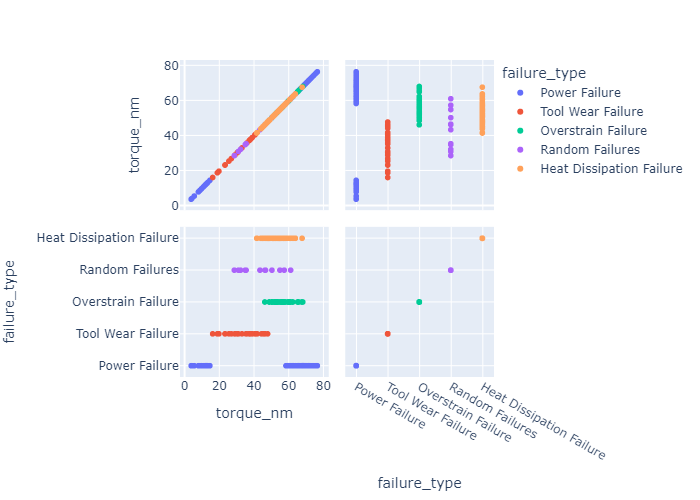

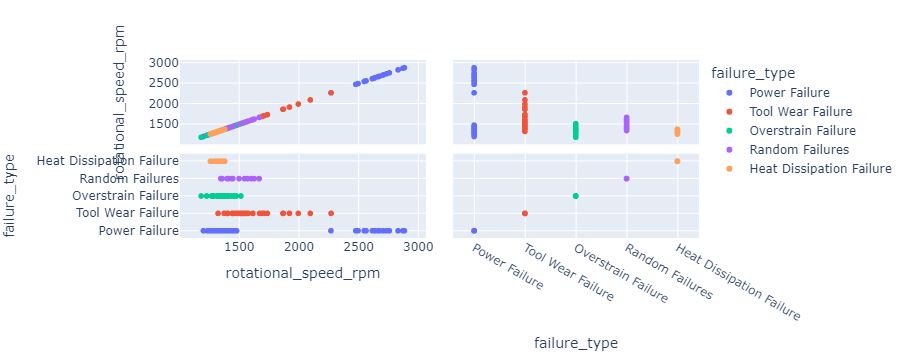

In [21]:
graph = px.scatter_matrix(basescatter, dimensions=['rotational_speed_rpm', 'failure_type'], color = 'failure_type')
graph

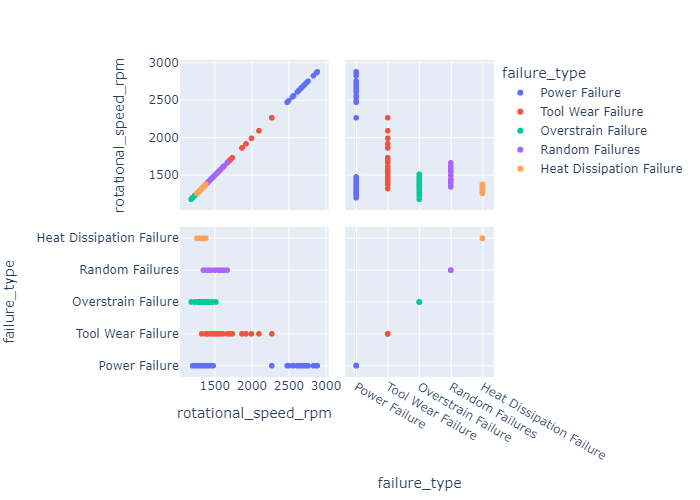

#### Toolwear

* The failures of type 'Tool Wear Failure' and 'Overstrain Failure' occur within restricted ranges of 'tool_wear_min' values.

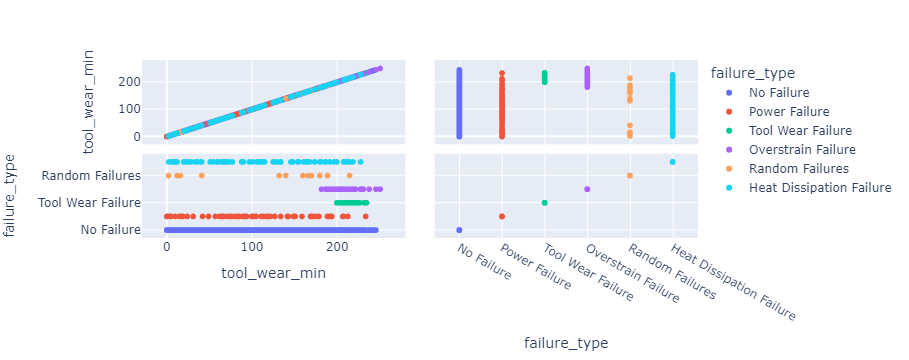

In [23]:
graph = px.scatter_matrix(dataSet, dimensions=['tool_wear_min', 'failure_type'], color = 'failure_type')
graph

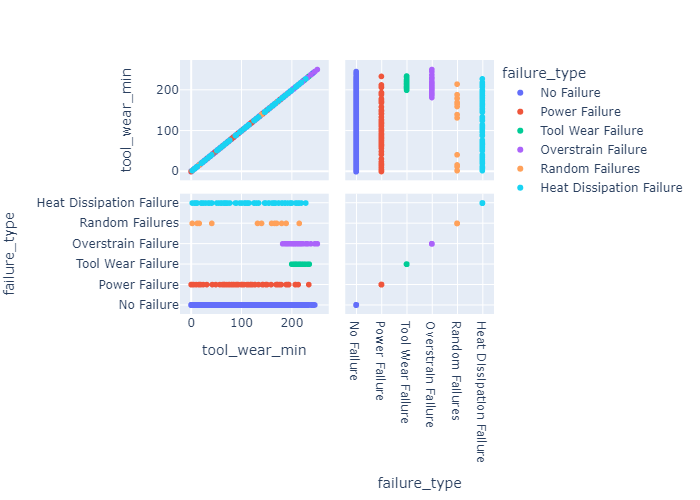

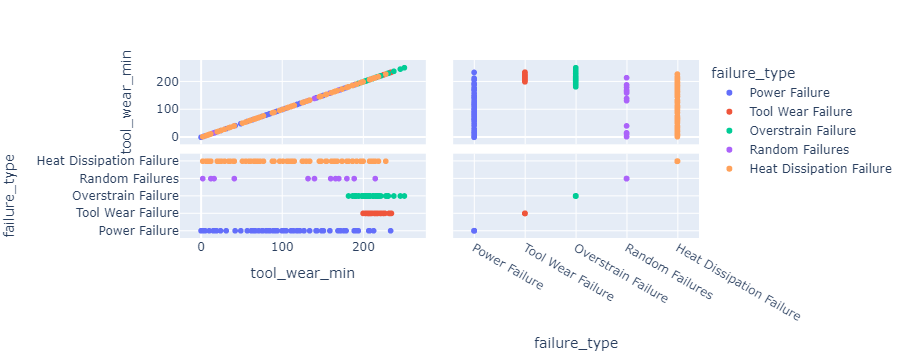

In [25]:
graph = px.scatter_matrix(basescatter, dimensions=['tool_wear_min', 'failure_type'], color = 'failure_type')
graph

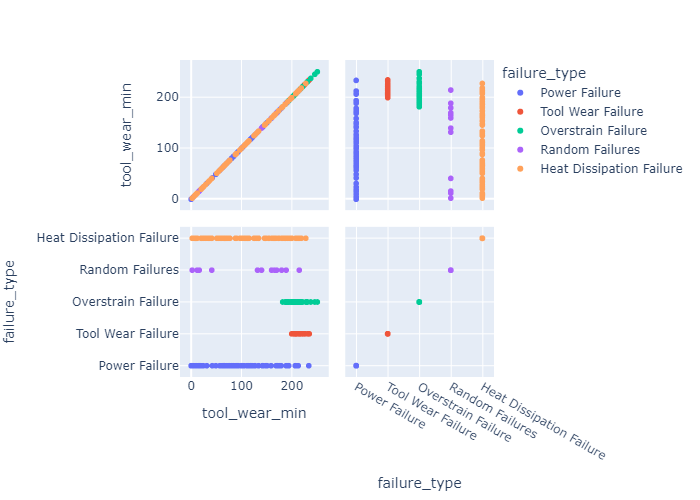